# Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Задача - подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Содержание проекта:**  
1. [Знакомство с данными](#start)
2. [Предобработка данных](#correction)  
  2.1. [Обработка дубликатов и пропусков в данных](#dup_and_null)  
  2.2. [Создание новых столбцов](#new_col)
3. [Исследовательский анализ данных](#analysis)
4. [Детализируем исследование: открытие кофейни](#cafe)

## 1. Знакомство с данными
<a id="start"></a>

Импортируем нужные библиотеки, загрузим таблицу и познакомимся с данными.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import folium
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import urllib

In [2]:
df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [3]:
df.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0


**Описание данных:**  

`name` — название заведения  
`address` — адрес заведения  
`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»  
`hours` — информация о днях и часах работы  
`lat` — широта географической точки, в которой находится заведение  
`lng` — долгота географической точки, в которой находится заведение  
`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0)  
`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее  
`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:  
- «Средний счёт: 1000–1500 ₽»  
- «Цена чашки капучино: 130–220 ₽»  
- «Цена бокала пива: 400–600 ₽»  
- и так далее  

`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:  
- если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений
- если в строке указано одно число — цена без диапазона, то в столбец войдёт это число
- если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:  
- если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений
- если в строке указано одно число — цена без диапазона, то в столбец войдёт это число
- если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт

`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):  
- 0 — заведение не является сетевым
- 1 — заведение является сетевым

`district` — административный район, в котором находится заведение, например Центральный административный округ  
`seats` — количество посадочных мест

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Итак, мы имеем таблицу с данными о 8406 заведениях Москвы. 
Для каждого заведения указаны название, категория, адрес, район, широта и долгота, рейтинг и информация о том, является ли заведение сетевым.  
В остальных столбцах есть пропуски: так, время работы указано только для 7870 заведений, ценовая категория для 3315 заведений, средняя стоимость разных блюд для 3816 заведений, средний счет для 3149 заведений, цена чашки капучино для 535 заведений, число посадочных мест для 4795 заведений.

## 2. Предобработка данных
<a id="correction"></a>

### 2.1. Обработка дубликатов и пропусков в данных
<a id="dup_and_null"></a>

Проверим таблицу на явные дубликаты.

In [5]:
df.duplicated().sum()

0

In [6]:
df.applymap(lambda x: x.lower() if type(x) == str else x).duplicated().sum()

0

Явных дубликатов нет. Проверим таблицу на неявные дубликаты.

In [7]:
df['name'].duplicated().sum()

2792

В таблице есть повторяющиеся названия заведений, но у нас есть сетевые заведения с одинаковым названием, вероятно, это они.  
Посмотрим на 20-ку самых многочисленных названий.

In [8]:
df['name'].value_counts().head(20)

Кафе                                   189
Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Яндекс Лавка                            69
Cofix                                   65
Prime                                   50
Хинкальная                              44
Шаурма                                  43
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
Ресторан                                34
CofeFest                                32
Буханка                                 32
Столовая                                28
Му-Му                                   27
Drive Café                              24
Name: name, dtype: int64

Похоже на правду. Также в список попали заведения без названия - Кафе, Хинкальная, Шаурма, Ресторан, Столовая.  
Проверим, нет ли дубликатов в столбце с названием и адресом вместе взятыми.

In [9]:
df[['name', 'address']].duplicated().sum()

0

In [10]:
df[['name', 'address']].applymap(lambda x: x.lower()).duplicated().sum()

4

Когда мы перевели строки в нижний регистр, нашлось 4 дубликата. Посмотрим на эти строчки.

In [11]:
df[df[['name', 'address']].applymap(lambda x: x.lower()).duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,Кафе,кафе,"Москва, парк Ангарские Пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,Кафе,кафе,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,More poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,Раковарня Клешни и Хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,Хлеб да Выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


И правда, мы видим, что это дубликаты, которые появились из-за разного регистра букв. Незначительно отличается долгота и широта, остальные данные такие же, поэтому смело удалим дубли.

In [12]:
df = df[~df[['name', 'address']].applymap(lambda x: x.lower()).duplicated()].reset_index(drop=True)
df[['name', 'address']].applymap(lambda x: x.lower()).duplicated().sum()

0

Проверим неявные дубликаты в категориальных столбцах.

In [13]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [14]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [15]:
df['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

Неявных дубликатов нет.

Посмотрим еще раз на пропуски в столбцах.

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8402 entries, 0 to 8401
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.1+ KB


In [17]:
df.isna().mean()

name                 0.000000
category             0.000000
address              0.000000
district             0.000000
hours                0.063675
lat                  0.000000
lng                  0.000000
rating               0.000000
price                0.605451
avg_bill             0.545822
middle_avg_bill      0.625208
middle_coffee_cup    0.936325
chain                0.000000
seats                0.429660
dtype: float64

Как мы видим, большая доля пропусков в столбцах с категорией цен, средними ценами блюд, средним чеком, ценой чашки капучино и количеством посадочных мест. Мы не можем заменить эти пропуски каким-либо данными, поэтому оставим как есть. Небольшая доля пропусков в столбце с часами работы, но мы также не можем заменить эти пропуски чем-либо, поэтому оставим их тоже.

### 2.2. Создание новых столбцов
<a id="new_col"></a>

Создадим столбец `street` с названиями улиц из столбца с адресом.

In [18]:
df['street'] = df['address'].str.split(', ').str[1]

Создадим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно.

In [19]:
df['is_24/7'] = False # задаем по умолчанию значение каждой строки False

df.loc[df['hours'] == 'ежедневно, круглосуточно', 'is_24/7'] = True # меняем на True, если оно работает ежедневно, круглосуточно

Проверим таблицу с новыми столбцами.

In [20]:
df.tail()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
8397,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8398,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8399,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8400,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True
8401,Kebab Time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0,Россошанский проезд,True


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8402 entries, 0 to 8401
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
 14  street             8402 non-null   object 
 15  is_24/7            8402 non-null   bool   
dtypes: bool(1), float64(6), 

Предобработка данных окончена.

## 3. Исследовательский анализ данных
<a id="analysis"></a>

Для начала исследуем количество объектов общественного питания по категориям.

In [22]:
fig = go.Figure(
    data=go.Pie(
        labels=df.groupby('category').agg({'name': 'count'}).reset_index().sort_values(by='name', ascending=False)['category'], 
        values=df.groupby('category').agg({'name': 'count'}).reset_index().sort_values(by='name', ascending=False)['name'],
        pull=[0.05, 0, 0]
    )
)

fig.update_layout(title='Распределение заведений по категориям')
fig.update_traces(hoverinfo='label', textinfo='value+percent', textposition='inside',
                 marker=dict(colors=['#C8566B', '#E78963', '#F2D48F', '#9D75BF', '#9EC299', '#6661AB', '#FECBCB', '#BED0E8']))

fig.show()

Всего у нас 8 категорий заведений, больше всего - кафе и ресторанов, меньше всего - булочных и столовых.

Исследуем количество посадочных мест в заведениях по категориям.

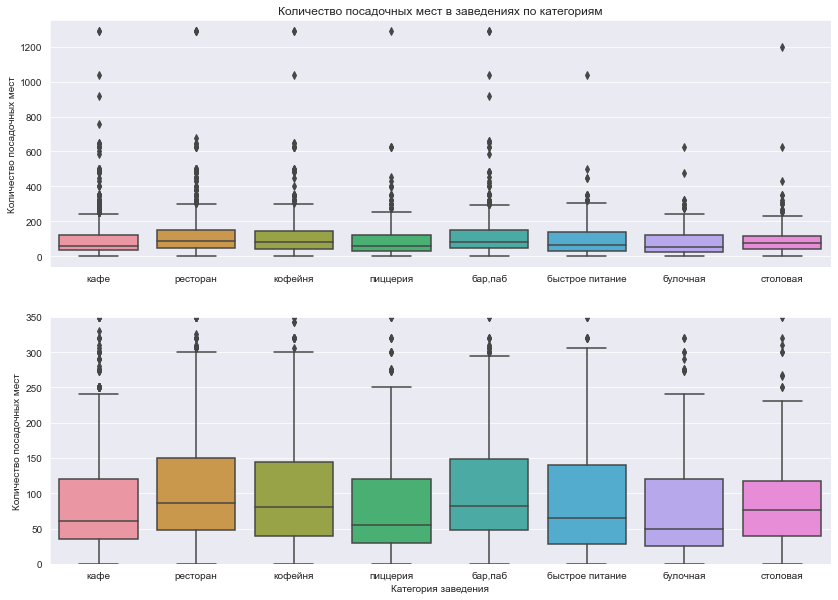

In [23]:
sns.set_style('darkgrid')
plt.style.use('seaborn-pastel')

plt.subplots(nrows=2, ncols=1, figsize=(14, 10))

plt.subplot(2, 1, 1)
plt.title('Количество посадочных мест в заведениях по категориям')
sns.boxplot(data=df, x='category', y='seats')
plt.ylabel('Количество посадочных мест')
plt.xlabel(' ')

plt.subplot(2, 1, 2)
sns.boxplot(data=df, x='category', y='seats')
plt.ylabel('Количество посадочных мест')
plt.xlabel('Категория заведения')
plt.ylim(0, 350)

plt.show()

Судя по медианам и межквартильным размахам в среднем в кафе, пиццериях, булочных и столовых меньше посадочных мест, чем в ресторанах, кофейнях, барах и заведениях быстрого питания. В целом, во всех категориях заведений среднее количество посадочных мест различается не сильно - везде в среднем 50-100 посадочных мест, если смотреть по медиане. Во всех категориях есть выбросы - заведения с количеством посадочных мест до 1300. Меньше всего выбросов у булочных - максимальное значение до 700 посадочных мест.

Рассмотрим соотношение сетевых и несетевых заведений в датасете.

In [24]:
chain = df.groupby('chain').agg({'name': 'count'}).reset_index()
chain.loc[chain['chain'] == 0, 'chain'] = 'Несетевые заведения'
chain.loc[chain['chain'] == 1, 'chain'] = 'Сетевые заведения'


fig = go.Figure(
    data=go.Pie(
        labels=chain['chain'], 
        values=chain['name'],
        pull=[0.05, 0, 0]
    )
)

fig.update_layout(title='Соотношение сетевых и несетевых заведений в датасете')
fig.update_traces(hoverinfo='label', textinfo='value+percent', marker=dict(colors=['#D291BC', '#957DAD']))

fig.show()

В датасете 3203 сетевых заведений и 5199 несетевых заведений. Сетевых заведений гораздо меньше - 38.1%, несетевых - 61.9%.

Проверим, какие категории заведений чаще являются сетевыми.

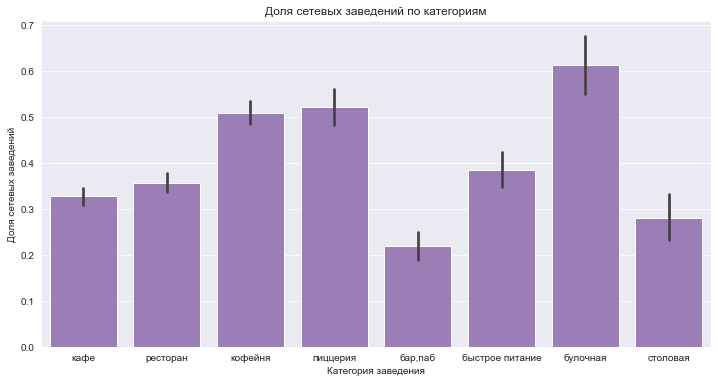

In [25]:
plt.figure(figsize=(12, 6))

sns.barplot(x='category', y='chain', data=df, color='#9D75BF')
plt.title('Доля сетевых заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Доля сетевых заведений')

plt.show()

Из всех категорий булочные чаще всего являются сетевыми заведениями. Около 60% булочных в датасете - сетевые. Немного уступают кофейни и пиццерии - около 50% являются сетевыми. Среди всех категорий бары, пабы реже всего являются сетевыми заведениями. Всего около 20% баров, пабов в датасете - сетевые.

Найдем топ-15 популярных сетей в Москве с наибольшим количеством заведений.

In [26]:
# создаем таблицу с сетями, сгруппировав основную таблицу по названию заведений
top_chains = df.groupby('name').agg({'address': 'count', 'category': 'first', 'chain': 'mean'}).reset_index()
top_chains.columns = ['name', 'cnt', 'category', 'chain']
top_chains = top_chains.sort_values(by='cnt', ascending=False)

# удаляем заведения, которые на самом деле не являются сетевыми, но попали 
# в таблицу из-за одинаковых названий, напр. "Кафе", "Ресторан" и т.д.,
# оставляем нужные столбцы и строки
top_chains = top_chains[top_chains['chain'] == 1][['name', 'cnt', 'category']].head(15).reset_index(drop=True)

# строим график по полученным данным
fig = px.bar(top_chains, x='name', y='cnt', color='category', color_discrete_sequence=px.colors.qualitative.T10)

fig.update_layout(title='Топ-15 популярных сетей в Москве',
                  xaxis_title='Название сети',
                  yaxis_title='Количество заведений в сети')

fig.show()

Итак, треть сетей в топе-15 занимают кофейни. Также вошли две сети пиццерий, три сети ресторанов, одна сеть быстрого питания, три сети кафе и одна сеть булочных. Сети баров и столовых отсутствуют.  
Самая большая сеть по количеству заведений - кофейня Шоколадница - насчитывает 120 заведений в Москве.  
Остальные сети кофеен из топа-15 имеют от 32 до 71 заведения в регионе. Сети пиццерий имеют 74-76 заведений, ресторанов - 38-69 заведений, кафе - 27-39 заведений, сеть быстрого питания Хинкальная - 44 заведения, сеть булочных Буханка - 32 заведения.

Посмотрим, какие административные районы Москвы присутствуют в датасете. Отобразим общее количество заведений и количество заведений каждой категории по районам. 

In [27]:
fig = px.bar(df.groupby(['district', 'category']).agg({'name': 'count'}).reset_index().sort_values(by='name'),
             x='name', y='district', color='category', color_discrete_sequence=px.colors.qualitative.T10)
fig.update_layout(title='Количество заведений по районам',
                  xaxis_title='Количество заведений',
                  yaxis_title='Административный округ')

fig.show()

Всего у нас 9 административных округов. По графику сразу видно, что в центральном административном округе в 2-3 раза больше заведений, чем в других округах. Меньше всего заведений в северо-западном округе.  
В центральном округе преобладают рестораны, затем идут кафе, кофейни и бары. Меньше всего булочных и столовых.  
При этом в остальных округах преобладают кафе, а рестораны в них на втором месте, а в некоторых округах и на третьем - после кофеен. А вот булочных и столовых в остальных округах тоже очень мало. Также в остальных округах баров значительно меньше, чем в центральном. А вот пиццерий и заведений быстрого питания мало во всех округах, включая центральный.


Посмотрим на распределение средних рейтингов по категориям заведений.

In [28]:
fig = px.bar(df.groupby('category').agg({'rating': 'mean'}).reset_index().sort_values(by='rating', ascending=False),
             x='category', y='rating', text='rating', range_y=[3.5, 5])
fig.update_layout(title='Средние рейтинги заведений по категориям',
                  xaxis_title='Категория заведения',
                  yaxis_title='Средний рейтинг',
                  height=450, width=700)
fig.update_traces(texttemplate='%{text:.3s}', textposition='inside', marker=dict(color='#61465F'))

fig.show()

Средние рейтинги разных категорий заведений различаются совсем незначительно. Самый высокий средний рейтинг у баров, пабов - 4.39, самый низкий средний рейтинг у заведений быстрого питания - 4.05.

Построим фоновую картограмму со средним рейтингом заведений каждого района. 

In [29]:
# создаем таблицу с рейтингами заведений по районам
rating_df = df.groupby('district').agg({'rating': 'mean'}).reset_index()

# загружаем JSON-файл с границами округов Москвы
jsonurl = urllib.request.urlopen('https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson')
state_geo = json.loads(jsonurl.read())
    
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Средние рейтинги заведений в разных районах тоже различаются незначительно. Тем не менее, по картограмме видно, что средний рейтинг заведений в центральном округе выше, чем в остальных, а самый маленький средний рейтинг в юго-восточном административном округе.

Отобразим все заведения датасета на карте.

In [30]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}  {row['category']}  {row['rating']} ",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.

In [31]:
# создаем список с топ-15 улиц
top_15_street = df.groupby('street').agg(
    {'name': 'count'}).reset_index().sort_values(by='name', ascending=False).head(15).reset_index(drop=True)['street']

# создаем таблицу с топ-15 улиц с разделением по категориям заведений
top_15_street_df = df.query('street in @top_15_street').groupby(['street', 'category']).agg({'name': 'count'}).reset_index()

fig = px.bar(top_15_street_df, x='street', y='name', color='category', color_discrete_sequence=px.colors.qualitative.T10)
fig.update_layout(title='Распределение количества заведений по топ-15 улицам',
                  xaxis_title='Улица',
                  yaxis_title='Количество заведений')

fig.show()

Больше всего заведений на проспекте Мира - 183 заведения, причем большую часть занимают кафе, затем идут рестораны и кофейни, меньше всего - столовых и булочных (на некоторых улицах их вовсе нет). В целом почти на всех улицах из топ-15 преобладают рестораны, кафе и кофейни в разных соотношениях - где-то больше ресторанов, где-то кафе, а где-то кофеен. Баров больше всего на Ленинградском проспекте, заведений быстрого питания, кафе, кофеен и ресторанов - на проспекте Мира, пиццерий - на Профсоюзной улице, столовых - на Варшавском шоссе. 

Найдем улицы, на которых находится только один объект общепита.

In [32]:
# создаем список с улицами, на которых только один объект общепита
street_with_one_place = df.groupby('street').agg(
    {'name': 'count'}).reset_index().query('name == 1').reset_index(drop=True)['street']

print(f'Количество улиц с одним объектом общепита: {street_with_one_place.count()}')

Количество улиц с одним объектом общепита: 459


Всего таких улиц 459, посмотрим как они распределены по районам города.

In [33]:
fig = px.histogram(df.query('street in @street_with_one_place'), x='district')

fig.update_layout(title='Количество улиц с одним объектом общепита по районам',
                  xaxis_title='Административный округ',
                  yaxis_title='Количество улиц с одним объектом общепита')
fig.update_traces(marker=dict(color='#61465F'))

fig.show()

По количеству улиц с одним объектом общепита с большим отрывом лидирует центральный административный округ - в нем 145 таких улиц. Возможно, это связано с тем, что в центре много маленьких улиц.

Проанализируем средний счет в разных районах. Посчитаем медиану среднего счета заведений для каждого района и построим картограмму.

In [34]:
# создаем таблицу с медианой среднего счета для каждого района
district_avg_bill = df.groupby('district').agg({'middle_avg_bill': 'median'}).reset_index()

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений',
).add_to(m)

# выводим карту
m

Самый высокий средний счет в заведениях в центральном и западном административных округах - около 1000 руб. Самый низкий средний счет в южном, юго-восточном и северо-восточном округах - около 500 руб.

**Выводы:**  

`Категории заведений`  
Заведения в Москве делятся на 8 категорий: кафе, рестораны, кофейни, бары и пабы, пиццерии, заведения быстрого питания, столовые и булочные.  
Половину всех заведений Москвы занимают кафе и рестораны: кафе - 28.3% рынка, рестораны - 24.3% рынка. Кофейни занимают 16.8% рынка. Остальные категории заведений занимают меньше 10% рынка, меньше всего: булочные - 3% и столовые - 3.7%.

`Посадочные места`  
Большинство заведений имеют до 300 посадочных мест. В среднем в заведениях всех категорий 50-100 посадочных мест. 

`Сетевые и несетевые`  
Сетевых заведений среди всех - 38.1%, несетевых - 61.9%. Чаще всего являются сетевыми булочные - 60% всех булочных - сетевые. Также 50% кофеен и пиццерий являются сетевыми. Бары и пабы реже всего являются сетевыми заведениями, только 20% - сетевые.

`Самые крупные сети`  
Самые крупные сети насчитывают от 27 до 120 заведений. Самая крупная сеть - кофейня Шоколадница - у этой сети 120 заведений в Москве. В топ-15 самых крупных сетей входят 5 кофеен, 2 пиццерии, 3 ресторана, 1 заведение быстрого питания, 3 кафе и 1 булочная.

`Административные округа`  
Всего в Москве 9 административных округов. В центральном округе в 2-3 раза больше заведений, чем в других округах. Меньше всего заведений в северо-западном округе. Во всех округах преобладают кафе, рестораны и кофейни. 

`Рейтинги заведений`  
Средние рейтинги разных категорий заведений различаются незначительно. Самый высокий средний рейтинг у баров - 4.39, самый низкий - у заведений быстрого питания - 4.05. Средний рейтинг в центральном округе выше, чем в остальных, но различие по округам тоже незначительное.

`Улицы с наибольшим количеством заведений`  
Больше всего заведений на проспекте Мира - 183 заведения. Баров больше всего на Ленинградском проспекте, заведений быстрого питания, кафе, кофеен и ресторанов - на проспекте Мира, пиццерий - на Профсоюзной улице, столовых - на Варшавском шоссе. Также у нас есть 459 улиц всего с одним объектом общепита. Больше всего таких улиц в центральном округе - 145. В остальных округах таких улиц от 18 до 55.

`Средний счет`  
Самый высокий средний счет в заведениях в центральном и западном административных округах - около 1000 руб. Самый низкий средний счет в южном, юго-восточном и северо-восточном округах - около 500 руб.

## 4. Детализируем исследование: открытие кофейни
<a id="cafe"></a>

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

Посмотрим, сколько всего кофеен в датасете, в каких районах их больше всего и каковы особенности их расположения.

In [35]:
fig = go.Figure(
    data=go.Pie(
        labels=df.groupby('category').agg({'name': 'count'}).reset_index().sort_values(by='name', ascending=False)['category'], 
        values=df.groupby('category').agg({'name': 'count'}).reset_index().sort_values(by='name', ascending=False)['name'],
        pull=[0.05, 0, 0]
    )
)

fig.update_layout(title='Распределение заведений по категориям')
fig.update_traces(hoverinfo='label', textinfo='value+percent', textposition='inside',
                 marker=dict(colors=['#C8566B', '#E78963', '#F2D48F', '#9D75BF', '#9EC299', '#6661AB', '#FECBCB', '#BED0E8']))

fig.show()

Всего в датасете 1413 кофеен, что составляет 16.8% от всех заведений города.

In [36]:
fig = px.bar(
    df.query('category == "кофейня"').groupby(['district', 'chain']).agg(
        {'name': 'count'}).reset_index().sort_values(by='name', ascending=False), x='district', y='name', color='chain', 
         color_continuous_scale=px.colors.sequential.Sunset)

fig.update_layout(title='Количество кофеен по районам',
                  yaxis_title='Количество кофеен',
                  xaxis_title='Административный округ')

fig.show()

Больше всего кофеен в центральном административном округе - 428. Далее идет северный округ - в нем 193 кофейни, и северо-восточный округ - в нем 159 кофеен. В остальных округах 150 кофеен и меньше. Меньше всего кофеен в северо-западном округе - 62.  

При этом в большинстве округах кофейни делятся на сетевые и не сетевые примерно поровну. Выделяется здесь западный округ - в нем значительно больше сетевых кофеен, и юго-восточный округ - в нем, наоборот, сетевых кофеен значительно меньше - почти в два раза.

Найдем топ-15 улиц по количеству кофеен.

In [37]:
# создаем таблицу с топ-15 улиц по количеству кофеен
top_15_street_cof_df = df.query('category == "кофейня"').groupby('street').agg(
    {'name': 'count'}).reset_index().sort_values(by='name', ascending=False).head(15).reset_index(drop=True)

# создаем список с топ-15 улиц по количеству кофеен
top_15_street_cof = top_15_street_cof_df['street']

fig = px.bar(df.query('category == "кофейня" and street in @top_15_street_cof').groupby(['street', 'chain']).agg(
    {'name': 'count'}).reset_index().sort_values(by='name', ascending=False).reset_index(drop=True), 
             x='street', y='name', color='chain', color_continuous_scale=px.colors.sequential.Sunset)
fig.update_layout(title='Топ-15 улиц по количеству кофеен',
                  xaxis_title='Улица',
                  yaxis_title='Количество кофеен')

fig.show()

Больше всего кофеен на проспекте Мира - 36, далее идет Ленинградский проспект - на нем 25 кофеен и Ленинский проспект - на нем 23 кофейни. На остальных улицах из топ-15 меньше 20 кофеен. При этом на большинстве улиц преобладают сетевые кофейни, кроме Ленинского проспекта, Ленинградского проспекта, Новодмитровской улицы и Волгоградского проспекта - там преобладают не сетевые кофейни.

Найдем топ-20 сетей кофеен.

In [38]:
# создаем таблицу с сетями кофеен
top_cof_chains = df.query('category == "кофейня"').groupby('name').agg({'address': 'count', 'chain': 'mean'}).reset_index()
top_cof_chains.columns = ['name', 'cnt', 'chain']
top_cof_chains = top_cof_chains.sort_values(by='cnt', ascending=False)

# удаляем заведения, которые на самом деле не являются сетевыми, но попали 
# в таблицу из-за одинаковых названий, напр. "Кафе", "Ресторан" и т.д.,
# оставляем нужные столбцы и строки
top_cof_chains = top_cof_chains[top_cof_chains['chain'] == 1][['name', 'cnt']].head(20).reset_index(drop=True)

# строим график по полученным данным
fig = px.bar(top_cof_chains, x='name', y='cnt')

fig.update_layout(title='Топ-20 популярных сетей кофеен в Москве',
                  xaxis_title='Название сети',
                  yaxis_title='Количество заведений в сети')
fig.update_traces(marker=dict(color='#F2D48F'))

fig.show()

Итак, про Шоколадницу мы помним - это вообще самая большая сеть заведений в Москве. Эта сеть кофеен насчитывает 119 заведений. Далее идут One Price Coffee с 71 заведением, Cofix с 65 заведениями, КОФЕПОРТ с 42 заведениями, CofeFest  с 31 заведениями и т.д. 

Отобразим все кофейни на карте.

In [39]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}  {row['category']}  {row['rating']} ",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.query('category == "кофейня"').apply(create_clusters, axis=1)

# выводим карту
m

Посмотрим, бывают ли круглосуточные кофейни.

In [40]:
df.query('category == "кофейня"')['is_24/7'].value_counts()

False    1354
True       59
Name: is_24/7, dtype: int64

В датасете есть 59 круглосуточных кофеен. Совсем немного. Посмотрим, где они расположены.

In [41]:
fig = px.bar(
    df[(df['category'] == 'кофейня') & (df['is_24/7'] == True)].groupby(['district', 'chain']).agg(
        {'name': 'count'}).reset_index().sort_values(by='name', ascending=False), x='district', y='name', color='chain',
           color_continuous_scale=px.colors.sequential.Sunset)

fig.update_layout(title='Количество круглосуточных кофеен по районам',
                  yaxis_title='Количество круглосуточных кофеен',
                  xaxis_title='Административный округ')

fig.show()

Почти половина всех круглосуточных кофеен - 26 заведений - находится в центральном округе. В остальных округах таких кофеен меньше 10. Почти все круглосуточные кофейни - сетевые. 

Посмотрим, какие у кофеен рейтинги и как они распределяются по районам. Построим фоновую картограмму.

In [42]:
# создаем таблицу с рейтингами заведений по районам
rating_cof_df = df.query('category == "кофейня"').groupby('district').agg({'rating': 'mean'}).reset_index()

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cof_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий средний рейтинг у кофеен в центральном и северо-западном административных округах. Самый низкий - в западном и северо-восточном округах.  

Также посмотрим на распределение рейтингов кофеен на графике.

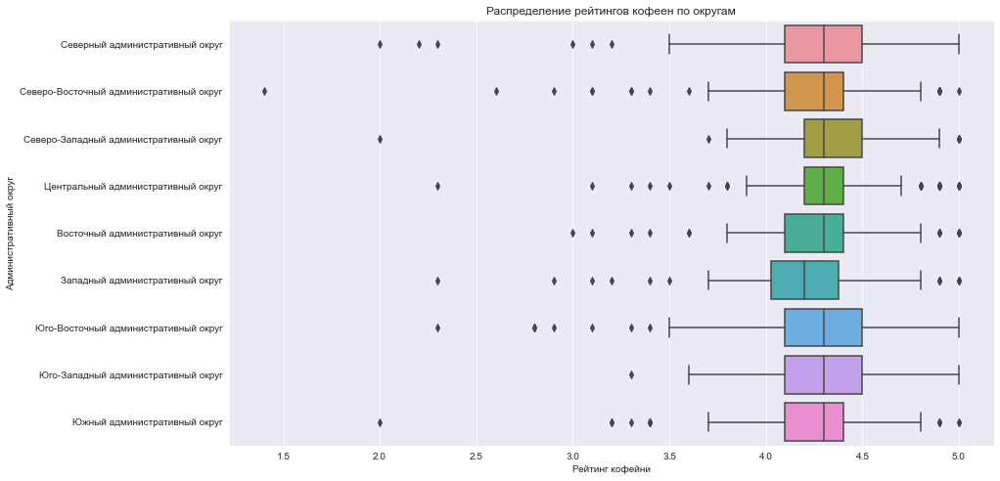

In [43]:
plt.figure(figsize=(14, 8))

plt.title('Распределение рейтингов кофеен по округам')
sns.boxplot(data=df.query('category == "кофейня"'), x='rating', y='district')
plt.xlabel('Рейтинг кофейни')
plt.ylabel('Административный округ')

plt.show()

По графику видно, что хоть и в центральном округе самый высокий средний рейтинг, оценку 5 там ставят не часто. Медианы всех округов вообще практически идентичны, кроме западного округа - в нем действительно и медиана меньше, как и среднее, что видно по предыдущему графику-картограмме. Самый большой межквартильный размах у северного, юго-восточного и юго-западного округов, что говорит о том, что там достаточно кофеен, которым ставят и максимально хороший рейтинг и достаточно плохой (меньше 4).

Попробуем определить, на какую стоимость чашки капучино стоит ориентироваться при открытии кофейни.

In [44]:
print('Медианная цена чашки капучино по Москве:', df.query('category == "кофейня"')['middle_coffee_cup'].median())

Медианная цена чашки капучино по Москве: 170.0


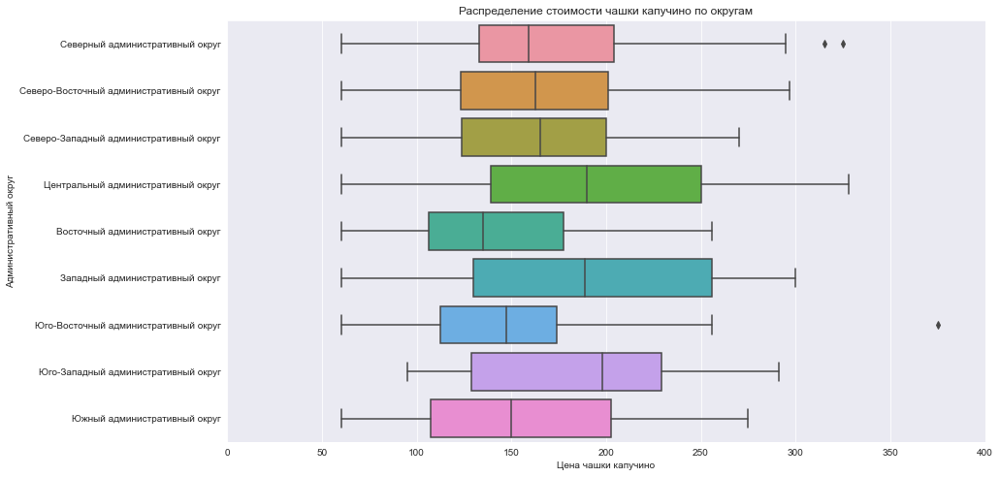

In [45]:
plt.figure(figsize=(14, 8))

plt.title('Распределение стоимости чашки капучино по округам')
sns.boxplot(data=df.query('category == "кофейня"'), x='middle_coffee_cup', y='district')
plt.xlabel('Цена чашки капучино')
plt.ylabel('Административный округ')
plt.xlim(0,400)

plt.show()

Медианная цена чашки капучино в Москве - 170 руб. При этом в каждом округе цена сильно разнится. Самая низкая цена чашки капучино в восточном, юго-восточном и южном округах - средняя цена тут составляет около 130-150 руб. При этом во всех округах в большинстве кофеен стоимость чашки капучино не меньше 110 руб. Чтобы сделать кофейню доступной, можно ориентироваться на эту цену.

**Выводы:**  
Можно порекомендовать открыть кофейню в `юго-восточном административном округе`: в нем небольшое количество кофеен и две трети из них не являются сетевыми, что может благоприятно сказаться на посещении, так как сетевым кофейням, как правило, больше доверяют, и в тех районах где их много - предпочтение могут отдавать им, чем новой неизвестной кофейне. Также в юго-восточном округе довольно много кофеен с плохим рейтингом, хотя есть и кофейни с максимальным рейтингом, но медианный рейтинг все же ниже 4.5. Но при этом, если ориентироваться по стоимости чашки капучино, то в юго-восточном округе итак довольно низкие цены, поэтому, октрывая кофейню здесь при желании сделать ее доступной, возможно придется немного снизить цены.

Также можно порекомендовать открыть кофейню в `юго-западном округе` по следующим причинам: в нем небольшое количество кофеен и довольно высокие цены - медианная стоимость чашки капучино - почти 200 рублей. Если открыть хорошую кофейню с более низкими ценами в этом районе, скорее всего она вызовет интерес.

Также можно порекомендовать открыть кофейню в `южном округе`: в нем кофеен больше, чем в предыдущих двух, но при этом очень мало кофеен с максимально высоким рейтингом, будет легче конкурировать. Уровень цен здесь примерно как в юго-восточном округе, то есть цены самые невысокие по Москве, поэтому также придется немного снизить цены, чтобы кофейня была доступной.